##### Copyright 2025 Google LLC.

# Spatial Awareness (Localization & Boundaries)

Image classification identifies *what* objects are in a scene. For manipulation tasks, we also need to know *where* they are.

By asking Gemini to provide **spatial coordinates**, we can obtain precise localization data that complements downstream planners and control systems.

This notebook covers:
1.  **Point Localization:** Finding coordinates for grasping or reaching targets.
2.  **Bounding Boxes:** Defining spatial extent for occupancy mapping.
3.  **Affordances & Segmentation:** Identifying graspable regions (handles, rims).
4.  **Trajectory Generation:** Planning a path through space.

## 1. Setup & Initialization

In [ ]:
%pip install -U -q google-genai google-colab

In [ ]:
import os
import urllib.request
import textwrap
from PIL import Image

if not os.path.exists('robotics_utils.py'):
    url = "https://raw.githubusercontent.com/williamito/robotics-samples/refs/heads/main/robotics_utils.py"
    urllib.request.urlretrieve(url, 'robotics_utils.py')

import robotics_utils as utils
utils.download_assets()

In [ ]:
from google.colab import userdata
from google import genai
from google.genai import types

GOOGLE_API_KEY = userdata.get("GOOGLE_API_KEY")
client = genai.Client(api_key=GOOGLE_API_KEY)

## 2. Part 1: Point Localization (The "Where")

### Example: Semantic Identification
Let's ask the model to find specific fruits on a cluttered table.

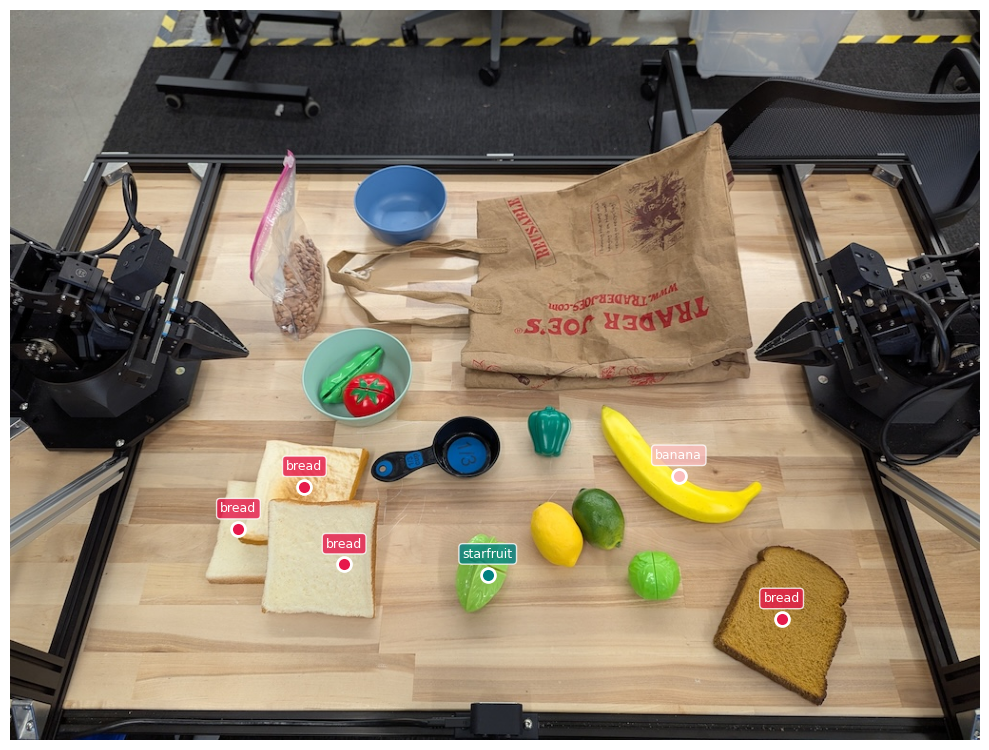

In [ ]:
img = Image.open("aloha-arms-table.png")
prompt = "Point to the bread, starfruit, and banana."

response = utils.query_gemini(client, img, prompt)
utils.visualize_detections(img, response)

### Example: Abstract Categories
We can also ask for categories of objects, like "fruit".

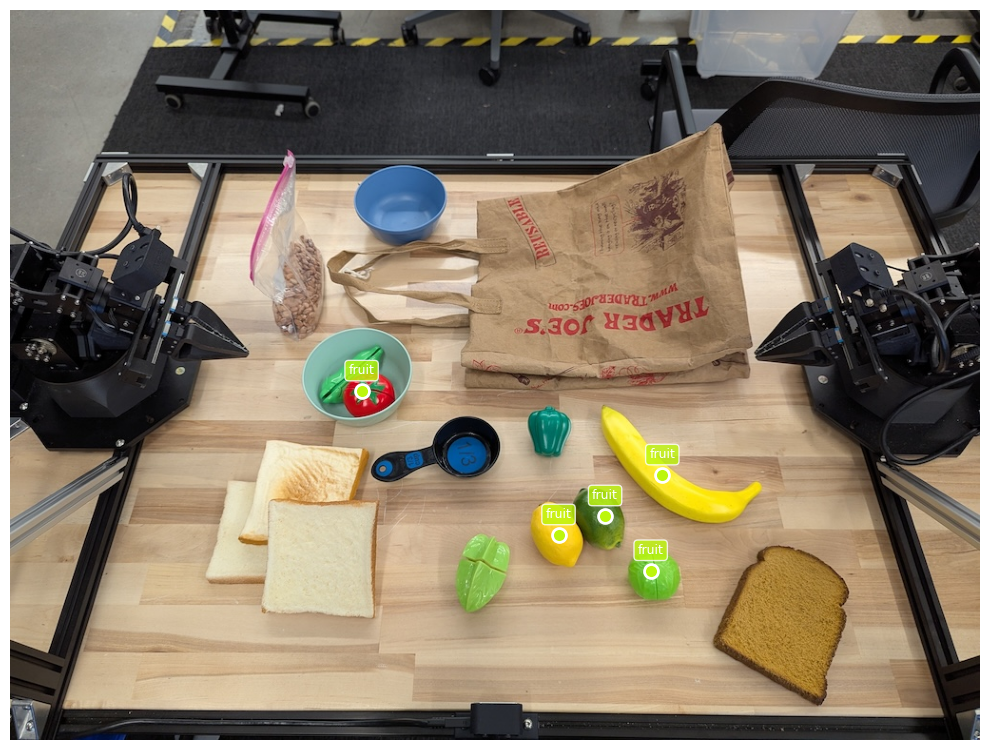

In [ ]:
prompt = "Get all points for fruit."
response = utils.query_gemini(client, img, prompt)
utils.visualize_detections(img, response)

### Example: Exhaustive Detection (All Instances)
Find every instance of a specific class, useful for game pieces or small parts.

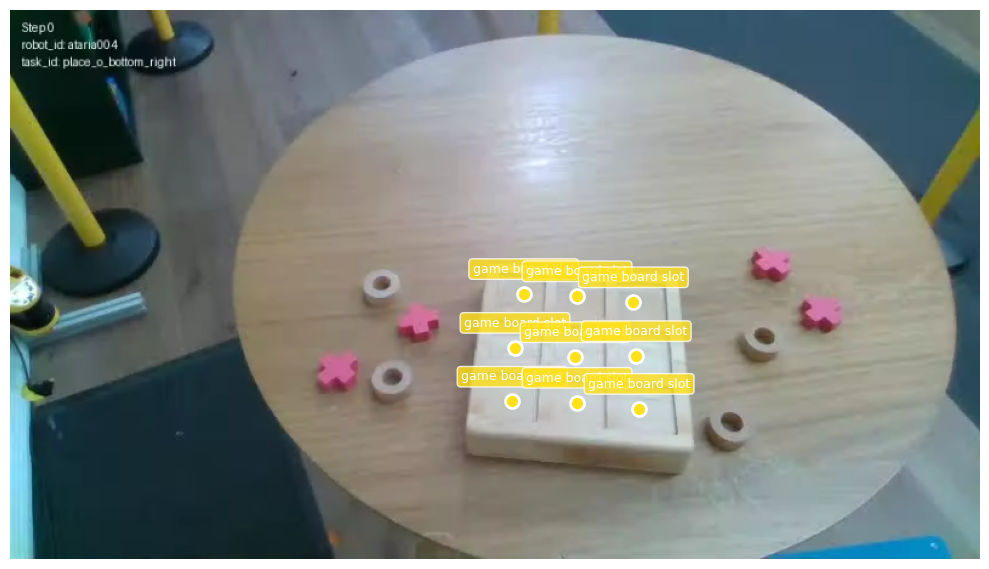

In [ ]:
img_game = Image.open("gameboard.png")
prompt = "Get all points matching game board slot."
response = utils.query_gemini(client, img_game, prompt)
utils.visualize_detections(img_game, response)

### Example: Counting by Pointing
Counting is often more accurate when the model points to each item it counts.

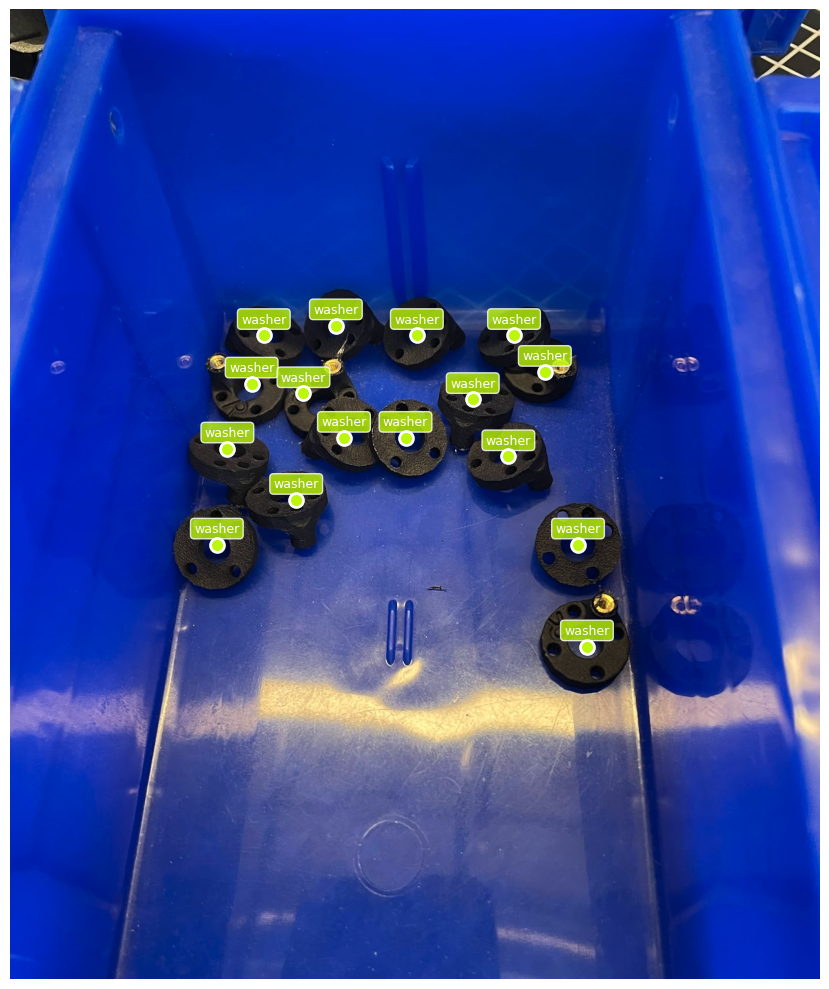

In [ ]:
img_washer = Image.open("washers.png")
prompt = "Point to each washer in the box."
response = utils.query_gemini(client, img_washer, prompt)
utils.visualize_detections(img_washer, response)

## 3. Part 2: Object Boundaries (The extent)

### Example: Inventory Scanning
Bounding boxes define the space occupied by an object.

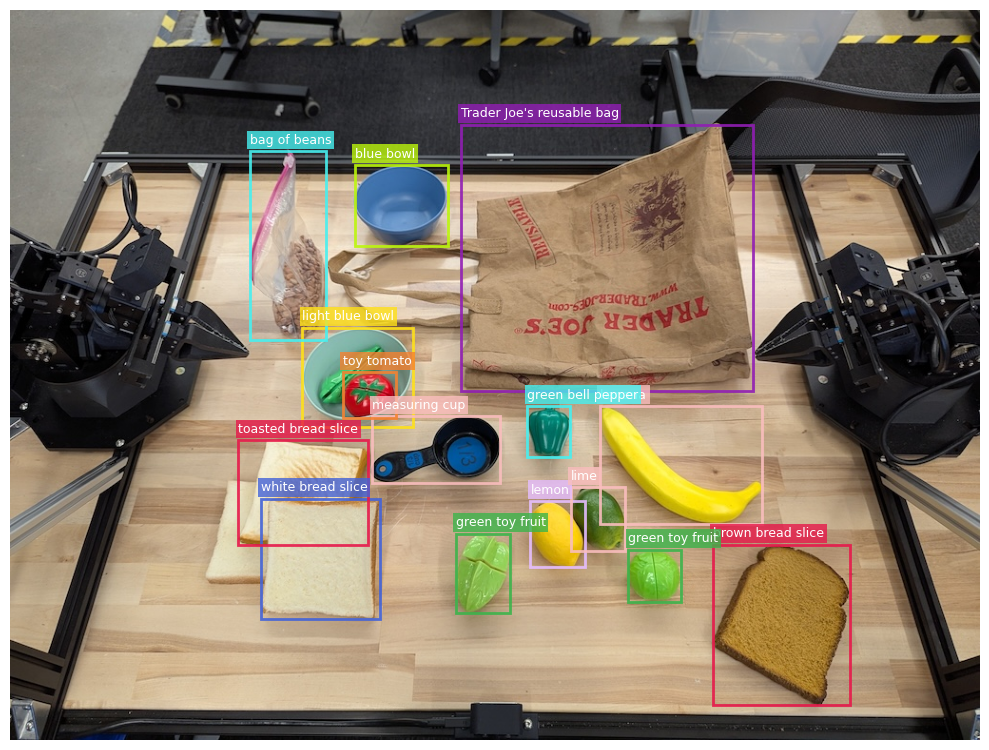

In [ ]:
prompt = "Return bounding boxes for all items on the table. Limit to 15 items."
response = utils.query_gemini(client, img, prompt)
utils.visualize_detections(img, response)

### Example: Semantic Regions (Navigation)
Sometimes the "Object" isn't a physical thing, but a Region. Here, we identify a specific location ("4th row") which might be the target for a mobile base to drive toward.

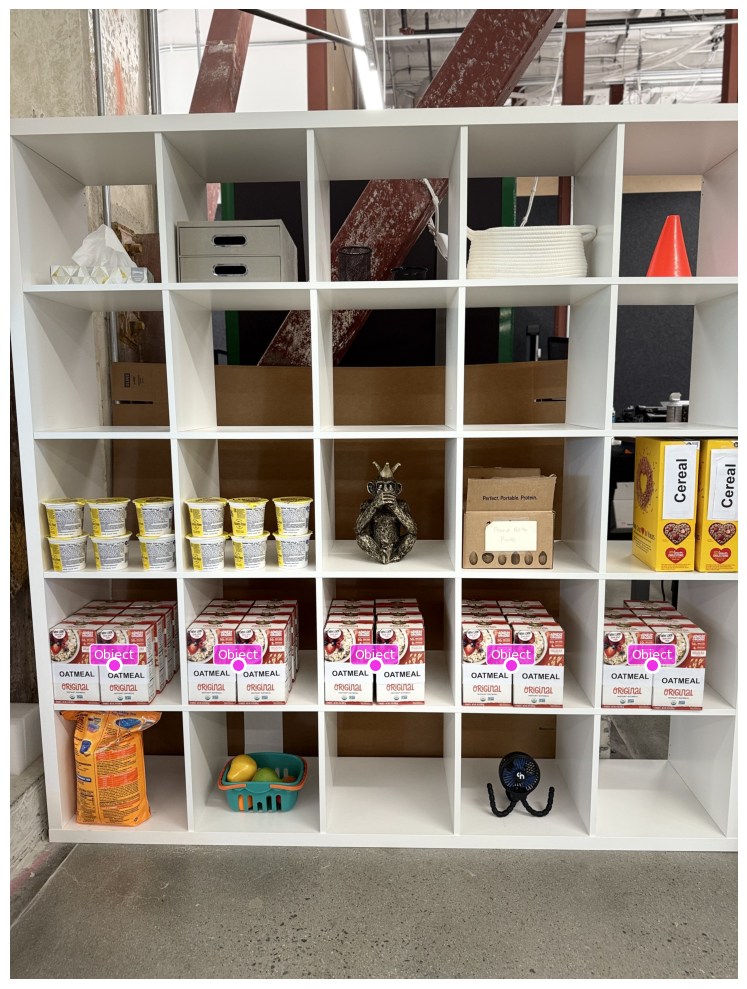

In [ ]:
img_shelf = Image.open("bookshelf.jpeg")
prompt = "Return bounding boxes highlighting all cubbies in the fourth row of shelves."
response = utils.query_gemini(client, img_shelf, prompt, thinking=True)
utils.visualize_detections(img_shelf, response)

## 4. Part 3: Precise Grasping (Affordances & Masks)

### Example: Finding Grasp Points
Robots shouldn't grab objects by their center; they need handles, rims, and stems.

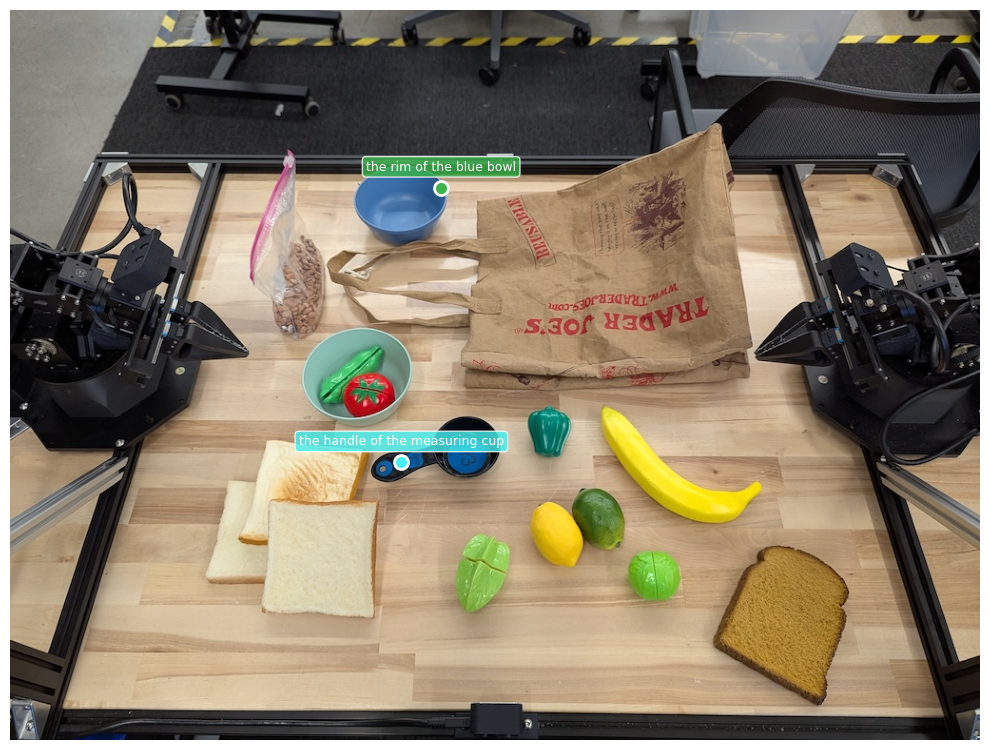

In [ ]:
prompt = "Point to the handle of the measuring cup and the rim of the blue bowl."
response = utils.query_gemini(client, img, prompt)
utils.visualize_detections(img, response)

### Example: Instance Segmentation
For irregular objects like fruit, a segmentation mask provides pixel-perfect boundaries.

In [ ]:
img_mango = Image.open("mango.png")
prompt = "Provide segmentation masks for the mango and the robot gripper fingers."
response = utils.query_gemini(client, img_mango, prompt)
utils.visualize_detections(img_mango, response)

Error: Could not parse detection string as JSON.


## 5. Part 4: Trajectory Generation

### Example: Fine Motor Trajectory
Generate a path for precise object manipulation.

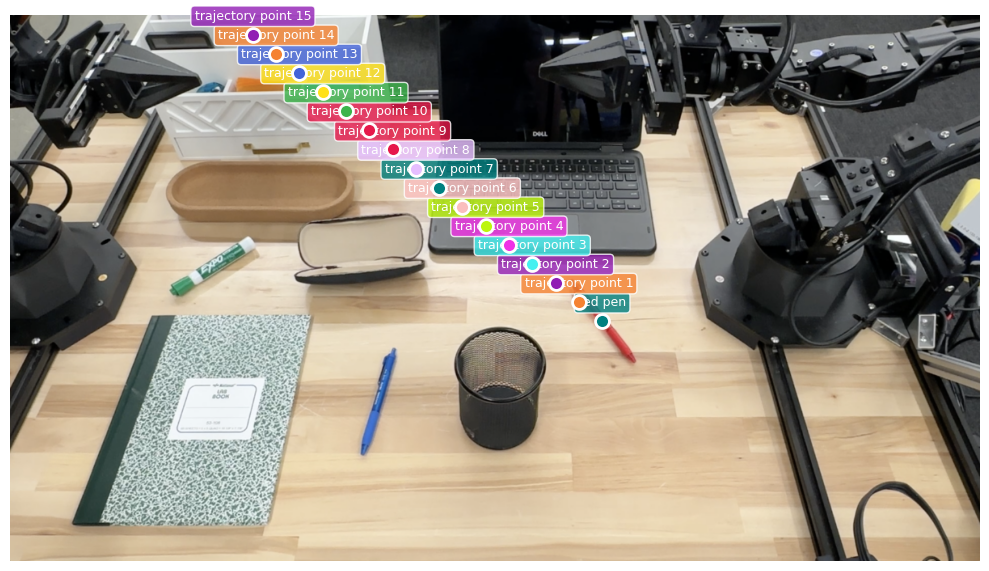

In [ ]:
img_desk = Image.open("aloha_desk.png")
prompt = "Place a point on the red pen, then 15 points for the trajectory of moving the red pen to the top of the organizer."
response = utils.query_gemini(client, img_desk, prompt, thinking=True)
utils.visualize_detections(img_desk, response)

### Example: Area Coverage Trajectory
Plan a path to cover a region, useful for cleaning or painting.

ValueError: too many values to unpack (expected 2)

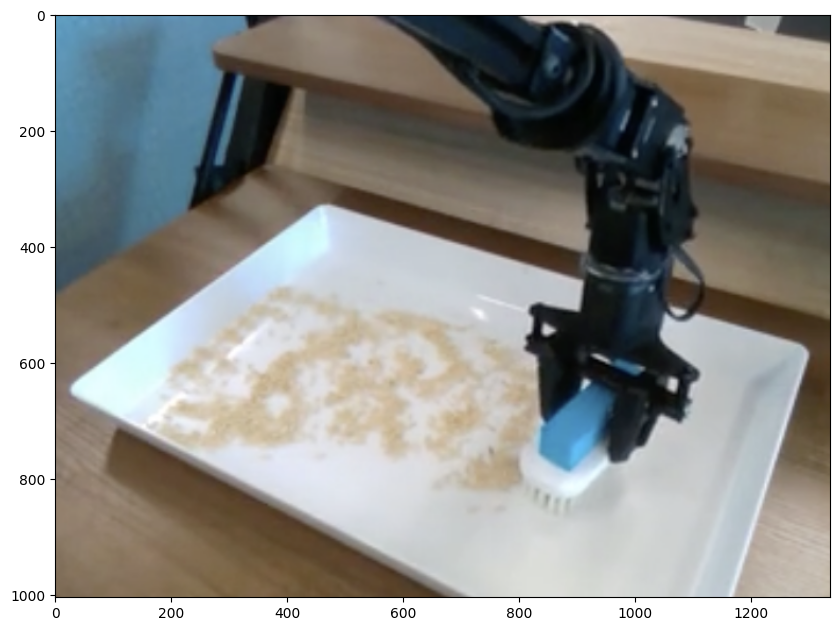

In [ ]:
img_particles = Image.open("particles.jpg")
prompt = "Point to the blue brush and a list of 10 points covering the region of particles."
response = utils.query_gemini(client, img_particles, prompt, thinking=True)
utils.visualize_detections(img_particles, response)

### Example: Navigation Path
The model can plan a path that avoids obstacles on the floor.

In [ ]:
img_room = Image.open("livingroom.jpeg")
prompt = "Point to a safe path on the floor from the current view to the green ottoman. Use 10 points."
response = utils.query_gemini(client, img_room, prompt, thinking=True)
utils.visualize_detections(img_room, response)

## Summary

In this notebook, you've learned how to translate visual semantic information into spatial data structures that a robot can use for motion and interaction.

**See Also:**
*   **[Physical Reasoning](./physical_reasoning.ipynb):** Learn how to reason about forces and material properties.
*   **[Task Orchestration](./task_orchestration.ipynb):** Learn how to manage complex workflows and video analysis.